In [ ]:
# # !pwd
# ! pip install kaggle
# ! mkdir ~/.kaggle/
# !cp /content/drive/MyDrive/.kaggle/kaggle.json ~/.kaggle/kaggle.json
# ! chmod 600 ~/.kaggle/kaggle.json
# ! kaggle competitions download gtzan-dataset-music-genre-classification


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
path=r'/content/drive/MyDrive/.kaggle/Data'

**Prediction using Features Extracted from Audio**

In [ ]:
import pandas as pd
feat30=pd.read_csv(path+"/features_30_sec.csv")
feat3=pd.read_csv(path+"/features_3_sec.csv")

In [ ]:
feat30.head()



,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [ ]:
feat3.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,0.081851,0.000558,-0.000078,0.008354,-0.000068,0.005535,129.199219,-118.627914,2440.286621,125.083626,260.956909,-23.443724,364.081726,41.321484,181.694855,-5.976108,152.963135,20.115141,75.652298,-16.045410,40.227104,17.855198,84.320282,-14.633434,83.437233,10.270527,97.001335,-9.708279,66.669891,10.183875,45.103611,-4.681614,34.169498,8.417439,48.269444,-7.233477,42.770947,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,0.087173,0.001030,-0.000099,0.004950,-0.000103,0.004854,123.046875,-125.590706,2038.344238,122.421227,216.774185,-20.718019,231.979767,50.128387,142.700409,-11.333302,139.243118,21.385401,77.817947,-15.960796,97.364029,19.454103,57.948093,-12.465918,68.271523,17.898169,56.222176,-11.732554,54.373909,8.145000,40.662876,-7.717751,30.808521,8.397150,48.784225,-8.300493,68.584824,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,0.071383,0.000425,-0.000066,0.012476,0.000065,0.004357,123.046875,-132.441940,3798.532227,115.085175,257.321289,-14.811666,192.448074,50.189293,144.166031,-0.680819,128.376892,24.650375,66.371170,-13.506104,89.319336,15.643386,55.253967,-13.216637,120.308784,10.406025,35.757862,-7.991465,47.911613,11.853963,36.569931,-4.677677,40.725075,6.571110,30.686846,-2.424750,50.313499,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,0.069426,0.000304,-0.000014,0.008318,0.000018,0.005927,123.046875,-118.231087,2508.781006,132.116501,332.650574,-18.758335,109.357529,39.769306,184.693344,-13.260426,144.398224,20.468134,122.516464,-14.563448,68.937332,18.745104,74.748886,-13.755463,73.868576,12.993759,41.549564,-12.648887,58.540478,10.389314,39.102024,-4.362739,60.714748,9.156193,40.411537,-9.889441,44.666325,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,0.070095,0.000289,0.000041,0.009634,-0.000106,0.005833,123.046875,-105.968376,2118.919922,134.643646,219.562622,-19.961748,171.878754,40.171753,103.120712,-14.271939,102.651230,18.734617,79.070000,-15.619381,48.510284,19.207966,53.642956,-18.274683,95.300995,14.316693,58.821163,-5.792194,55.030254,17.045437,43.229939,-5.681399,46.515259,5.705521,24.956211,-7.986080,39.816933,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [ ]:
feat3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 9990 non-null   object 
 1   length                   9990 non-null   int64  
 2   chroma_stft_mean         9990 non-null   float64
 3   chroma_stft_var          9990 non-null   float64
 4   rms_mean                 9990 non-null   float64
 5   rms_var                  9990 non-null   float64
 6   spectral_centroid_mean   9990 non-null   float64
 7   spectral_centroid_var    9990 non-null   float64
 8   spectral_bandwidth_mean  9990 non-null   float64
 9   spectral_bandwidth_var   9990 non-null   float64
 10  rolloff_mean             9990 non-null   float64
 11  rolloff_var              9990 non-null   float64
 12  zero_crossing_rate_mean  9990 non-null   float64
 13  zero_crossing_rate_var   9990 non-null   float64
 14  harmony_mean            

In [ ]:
print(feat30.shape)
print(feat3.shape)

(1000, 60)
(9990, 60)


In [ ]:
path

'/content/drive/MyDrive/.kaggle/Data'

In [ ]:
import os
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        print(os.path.join(dirname, filename))


Streaming output truncated to the last 5000 lines.
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00000.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00002.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00005.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00003.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00007.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00006.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00001.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00008.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00009.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00004.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00025.wav
/content/drive/MyDrive/.kaggle/Data/genres_original/country/country.00013.wav
/content/driv

In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
# import scipy
import os
# import pickle
# import librosa
# import librosa.display
# from IPython.display import Audio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow import keras

In [ ]:
class_list=feat3.iloc[:,-1]
converter=LabelEncoder()
y=converter.fit_transform(class_list)
print("label size=",y.size)
print(y)

label size= 9990
[0 0 0 ... 9 9 9]


In [ ]:
labels=converter.inverse_transform([0,1,2,3,4,5,6,7,8,9])

In [ ]:
labels

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype=object)

Lets scale the data

In [ ]:
from sklearn.preprocessing import StandardScaler
fit=StandardScaler()
X=fit.fit_transform(np.array(feat3.iloc[:,1:-1],dtype=float)) # remove the first column
X.shape

(9990, 58)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30)
print(X_train.shape,X_test.shape)

(6993, 58) (2997, 58)


In [ ]:
from tensorflow.keras.models import Sequential
import tensorflow as tf


In [ ]:
def trainModel(model,epochs,optimizer):
    batch_size=128
    model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics='accuracy')
    return model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=epochs,batch_size=batch_size)

def plotValidate(history):
    print("Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

In [ ]:
X_train.shape[1]

58

In [ ]:
#I have saved the model and using that so to train model again uncomment this
model=tf.keras.models.Sequential([
    tf.keras.layers.Dense(512,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(256,activation='relu'),
    keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(10,activation='softmax'),
])

print(model.summary())
# model = keras.models.load_model(path+'/my_models')
model_history=trainModel(model=model,epochs=600,optimizer='adam') # change no. of epoches to 600 while trainning the model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               30208     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               30208     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

In [ ]:
test_loss,test_acc=model.evaluate(X_test[0:50],y_test[0:50])
print("The test loss is ",test_loss)
print("The best accuracy is: ",test_acc*100)

2/2 [==============================] - 0s 8ms/step - loss: 0.8933 - accuracy: 0.9200
The test loss is  0.8932527899742126
The best accuracy is:  92.00000166893005


In [ ]:
outarr=np.array(model(X_test[1:3]))
labels[(np.argmax(outarr[1]))]


'metal'

In [ ]:
X_test[1:3]

array([[ 0.        , -1.35140615, -0.12834496,  0.56227005,  0.06632822,
         0.33576214, -0.60299195,  0.46991921,  0.04183045,  0.19305394,
        -0.22376981,  0.03245993, -0.29223322,  0.19182015,  0.62832437,
         0.37348127, -0.42927792, -0.05593536,  0.68380383, -0.73034758,
        -0.71954603, -0.49933888, -0.40032491, -0.18870066, -0.94476019,
        -0.78645714,  0.24400194, -0.59185964, -1.77749334, -0.83521661,
         0.30056805, -0.94902131, -1.47009235, -0.67168662,  0.2391382 ,
        -0.87538139, -0.69671695, -0.30797393,  0.81520058, -1.1143043 ,
        -1.15371355, -0.12505117,  1.10049536, -0.92826446, -0.39073452,
        -0.7728566 , -0.93596401, -0.53558689, -1.73363443,  0.53773627,
         0.19631249,  1.40783513, -0.2425469 ,  0.38847692,  0.47003184,
         2.28222435, -0.38253567,  1.61585921],
       [ 0.        ,  0.99244369, -0.19340747,  1.75756441, -0.45861822,
         1.04490891, -0.69825816,  0.22231836, -0.78889453,  0.60458586,
   

In [ ]:
# model.save(path+'/my_models')

**Prediction using Mel Spectrogram images**


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# ref: https://www.tensorflow.org/tutorials/images/classification

In [ ]:
path=r'/content/drive/MyDrive/.kaggle/Data'

In [ ]:
# labels 


In [ ]:
import pathlib
data_dir = pathlib.Path(path+"/images_original")
image_count = len(list(data_dir.glob('*/*.png')))
print(image_count)

999


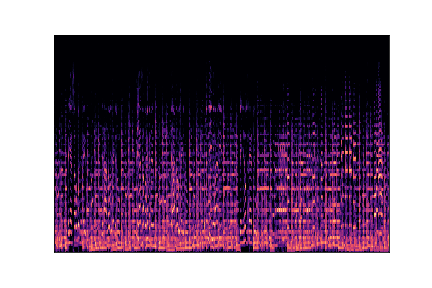

In [ ]:
blues = list(data_dir.glob('blues/*'))
PIL.Image.open(str(blues[0]))


In [ ]:
batch_size = 32
img_height = 288
img_width = 432

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 800 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 199 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


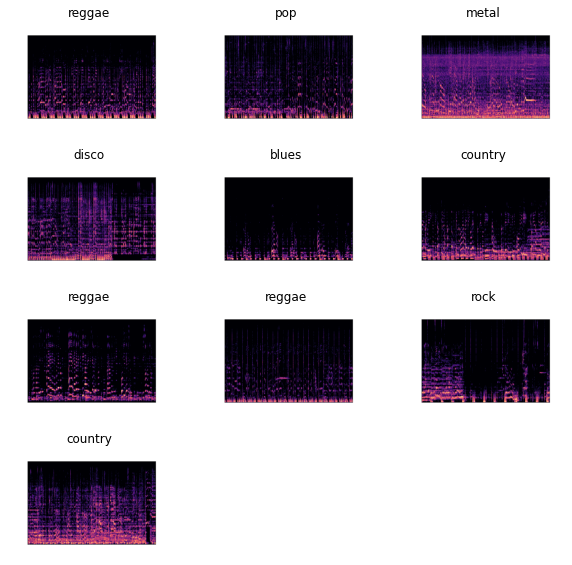

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(10):
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

**1-CNN1D**

In [ ]:
num_classes = 10

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv1D(16, 3, activation='relu',strides=1),
  layers.MaxPooling2D(),
  layers.Conv1D(32, 3, activation='relu',strides=1),
  layers.MaxPooling2D(),
  layers.Conv1D(64, 3, activation='relu',strides=1),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
epochs=20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
25/25 [==============================] - 6s 185ms/step - loss: 3.7957 - accuracy: 0.1412 - val_loss: 2.1597 - val_accuracy: 0.2312
Epoch 2/20
25/25 [==============================] - 4s 172ms/step - loss: 1.9188 - accuracy: 0.3313 - val_loss: 1.8388 - val_accuracy: 0.3518
Epoch 3/20
25/25 [==============================] - 4s 173ms/step - loss: 1.4136 - accuracy: 0.5337 - val_loss: 1.5953 - val_accuracy: 0.3769
Epoch 4/20
25/25 [==============================] - 4s 173ms/step - loss: 1.0503 - accuracy: 0.6488 - val_loss: 1.4094 - val_accuracy: 0.4523
Epoch 5/20
25/25 [==============================] - 4s 173ms/step - loss: 0.6211 - accuracy: 0.8512 - val_loss: 1.1879 - val_accuracy: 0.5829
Epoch 6/20
25/25 [==============================] - 4s 172ms/step - loss: 0.3536 - accuracy: 0.9100 - val_loss: 1.2101 - val_accuracy: 0.5729
Epoch 7/20
25/25 [==============================] - 4s 173ms/step - loss: 0.2077 - accuracy: 0.9663 - val_loss: 1.4653 - val_accuracy: 0.4523
Epoch 

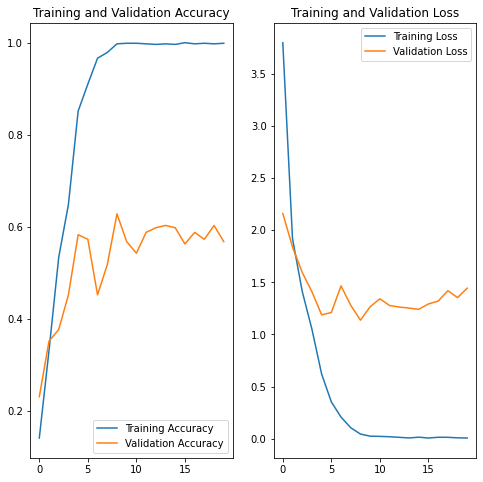

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**2-CNN2D**

In [ ]:
num_classes = 10
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
epochs=20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
25/25 [==============================] - 6s 159ms/step - loss: 3.3909 - accuracy: 0.1538 - val_loss: 2.2650 - val_accuracy: 0.1809
Epoch 2/20
25/25 [==============================] - 4s 145ms/step - loss: 1.9804 - accuracy: 0.3100 - val_loss: 1.9483 - val_accuracy: 0.2965
Epoch 3/20
25/25 [==============================] - 4s 145ms/step - loss: 1.5404 - accuracy: 0.4663 - val_loss: 1.7065 - val_accuracy: 0.4020
Epoch 4/20
25/25 [==============================] - 4s 144ms/step - loss: 1.1429 - accuracy: 0.6450 - val_loss: 1.3841 - val_accuracy: 0.5126
Epoch 5/20
25/25 [==============================] - 4s 145ms/step - loss: 0.7984 - accuracy: 0.7312 - val_loss: 1.3935 - val_accuracy: 0.4623
Epoch 6/20
25/25 [==============================] - 4s 145ms/step - loss: 0.5404 - accuracy: 0.8413 - val_loss: 1.3537 - val_accuracy: 0.5427
Epoch 7/20
25/25 [==============================] - 4s 144ms/step - loss: 0.2638 - accuracy: 0.9325 - val_loss: 1.1912 - val_accuracy: 0.5829
Epoch 

In [ ]:
# model.summary()

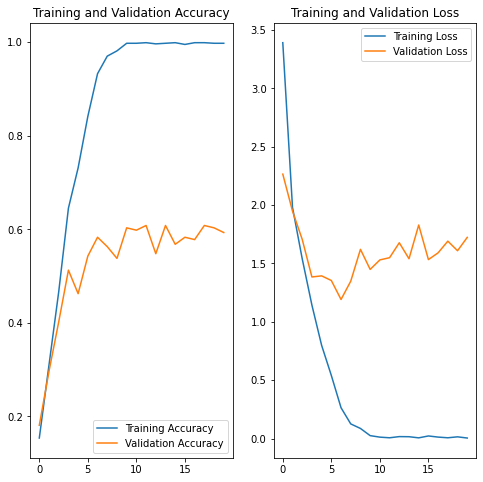

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**3-CNN2D- with data augmentation and dropouts  Usual Data Augmentation is logically incorrect**

In [ ]:
batch_size = 32
img_height = 288
img_width = 432

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

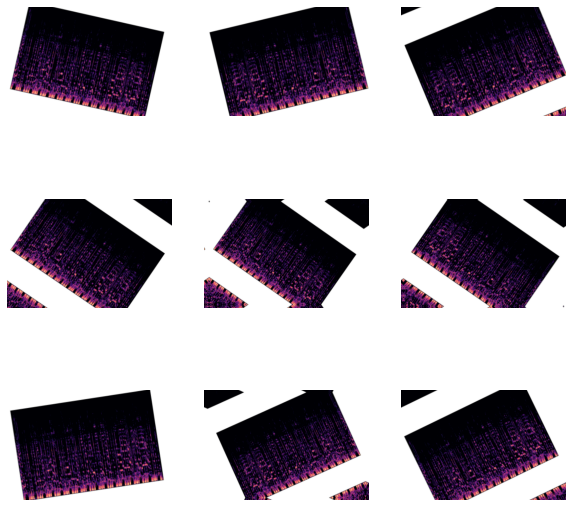

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [ ]:
num_classes=10
model = Sequential([
  # data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),

  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),

  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),

  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
# base_learning_rate=0.000001
model.compile(optimizer="adam",
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# model.summary()

In [ ]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
25/25 [==============================] - 8s 250ms/step - loss: 3.9681 - accuracy: 0.1100 - val_loss: 2.2981 - val_accuracy: 0.1407
Epoch 2/20
25/25 [==============================] - 7s 238ms/step - loss: 2.2904 - accuracy: 0.1550 - val_loss: 2.2677 - val_accuracy: 0.1558
Epoch 3/20
25/25 [==============================] - 7s 237ms/step - loss: 2.1085 - accuracy: 0.2300 - val_loss: 1.9528 - val_accuracy: 0.3065
Epoch 4/20
25/25 [==============================] - 7s 239ms/step - loss: 1.7394 - accuracy: 0.4175 - val_loss: 1.6912 - val_accuracy: 0.4422
Epoch 5/20
25/25 [==============================] - 7s 226ms/step - loss: 1.4797 - accuracy: 0.4938 - val_loss: 1.5376 - val_accuracy: 0.4623
Epoch 6/20
25/25 [==============================] - 7s 229ms/step - loss: 1.1943 - accuracy: 0.6012 - val_loss: 1.4348 - val_accuracy: 0.4774
Epoch 7/20
25/25 [==============================] - 7s 232ms/step - loss: 0.9154 - accuracy: 0.6862 - val_loss: 1.4006 - val_accuracy: 0.4824
Epoch 

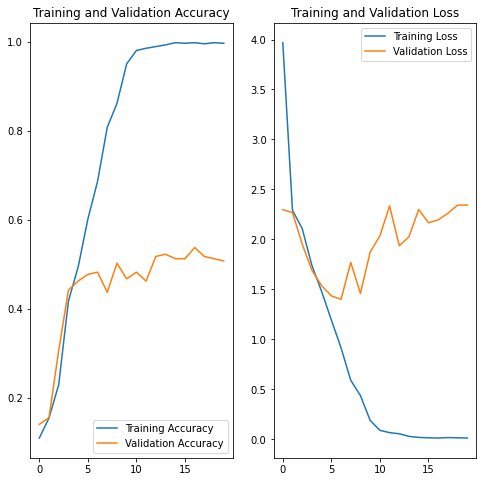

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# I ran the model multiple times which is why the graph is showing the loss and accuracy or last run. Kindly reconnect and run it again to get entire graph

In [ ]:
# # !pwd
# ! pip install kaggle
# ! mkdir ~/.kaggle/
# !cp /content/drive/MyDrive/.kaggle/kaggle.json ~/.kaggle/kaggle.json
# ! chmod 600 ~/.kaggle/kaggle.json
# ! kaggle competitions download gtzan-dataset-music-genre-classification


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path=r'/content/drive/MyDrive/.kaggle/Data'

In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
# import scipy
import os
# import pickle
# import librosa
# import librosa.display
# from IPython.display import Audio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow import keras

In [ ]:
from tensorflow.keras.models import Sequential
import tensorflow as tf


**Prediction using Mel Spectrogram, augmented images**


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# ref: https://www.tensorflow.org/tutorials/images/classification

In [ ]:
path=r'/content/drive/MyDrive/.kaggle/Data'

In [ ]:
# labels 


In [ ]:
import pathlib
data_dir = pathlib.Path(path+"/Aug_images")
image_count = len(list(data_dir.glob('*/*.png')))
print(image_count)

3996


In [ ]:
blues = list(data_dir.glob('blues/*'))
PIL.Image.open(str(blues[0])).size


(464, 235)

In [ ]:
batch_size = 32
img_height = 235
img_width = 464

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3996 files belonging to 10 classes.
Using 3197 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3996 files belonging to 10 classes.
Using 799 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


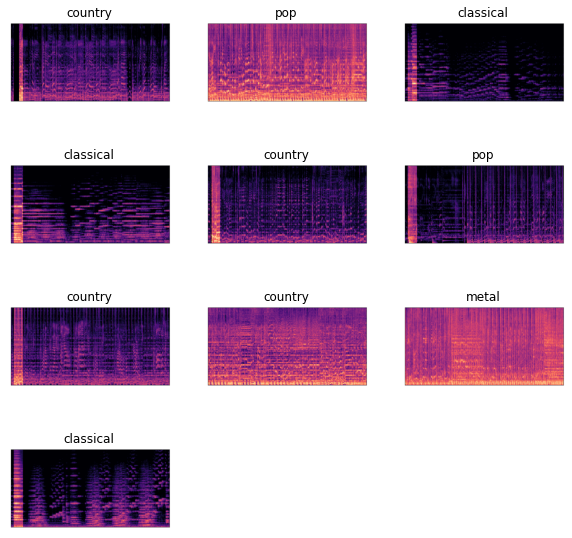

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(10):
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

**1-CNN1D with Spec Augmented Data**

In [ ]:
num_classes = 10

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv1D(16, 3, activation='relu',strides=1),
  layers.MaxPooling2D(),
  layers.Conv1D(32, 3, activation='relu',strides=1),
  layers.MaxPooling2D(),
  layers.Conv1D(64, 3, activation='relu',strides=1),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
epochs=20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
100/100 [==============================] - 353s 1s/step - loss: 2.4524 - accuracy: 0.2033 - val_loss: 1.9111 - val_accuracy: 0.2979
Epoch 2/20
100/100 [==============================] - 15s 152ms/step - loss: 1.4812 - accuracy: 0.4936 - val_loss: 1.3026 - val_accuracy: 0.5895
Epoch 3/20
100/100 [==============================] - 15s 153ms/step - loss: 0.7169 - accuracy: 0.7785 - val_loss: 0.8102 - val_accuracy: 0.7184
Epoch 4/20
100/100 [==============================] - 15s 152ms/step - loss: 0.2997 - accuracy: 0.9184 - val_loss: 0.3373 - val_accuracy: 0.8936
Epoch 5/20
100/100 [==============================] - 15s 151ms/step - loss: 0.0902 - accuracy: 0.9819 - val_loss: 0.1563 - val_accuracy: 0.9499
Epoch 6/20
100/100 [==============================] - 15s 152ms/step - loss: 0.0256 - accuracy: 0.9972 - val_loss: 0.2796 - val_accuracy: 0.8824
Epoch 7/20
100/100 [==============================] - 15s 152ms/step - loss: 0.0241 - accuracy: 0.9953 - val_loss: 0.0763 - val_accu

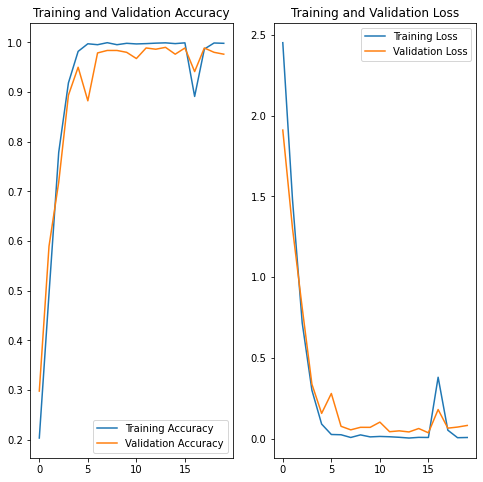

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**2-CNN2D with Spec Augmented data**

In [ ]:
num_classes = 10
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
cp="/content/drive/MyDrive/.kaggle/Data/"

In [ ]:
checkpoint_path = "CNN2D_with_Spec_Aug.ckpt"
checkpoint_dir = os.path.dirname(cp+checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=cp+checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [ ]:
epochs=20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[cp_callback]
)

Epoch 1/20
100/100 [==============================] - ETA: 0s - loss: 1.5223 - accuracy: 0.4639
Epoch 00001: saving model to /content/drive/MyDrive/.kaggle/Data/CNN2D_with_Spec_Aug.ckpt
100/100 [==============================] - 29s 296ms/step - loss: 1.5223 - accuracy: 0.4639 - val_loss: 1.1949 - val_accuracy: 0.6058
Epoch 2/20
100/100 [==============================] - ETA: 0s - loss: 1.0103 - accuracy: 0.6597
Epoch 00002: saving model to /content/drive/MyDrive/.kaggle/Data/CNN2D_with_Spec_Aug.ckpt
100/100 [==============================] - 14s 137ms/step - loss: 1.0103 - accuracy: 0.6597 - val_loss: 0.8699 - val_accuracy: 0.7222
Epoch 3/20
100/100 [==============================] - ETA: 0s - loss: 0.4656 - accuracy: 0.8558
Epoch 00003: saving model to /content/drive/MyDrive/.kaggle/Data/CNN2D_with_Spec_Aug.ckpt
100/100 [==============================] - 14s 137ms/step - loss: 0.4656 - accuracy: 0.8558 - val_loss: 0.4744 - val_accuracy: 0.8436
Epoch 4/20
100/100 [====================

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 235, 464, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 235, 464, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 117, 232, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 117, 232, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 58, 116, 32)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 58, 116, 64)       1

Lets load the model as it got disconnected but we have saved the model

In [ ]:
# define the architecture before loading weights
# model.load_weights(checkpoint_path)

# Re-evaluate the model
loss, acc = model.evaluate(val_ds, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

25/25 - 1s - loss: 0.1073 - accuracy: 0.9675 - 1s/epoch - 44ms/step
Restored model, accuracy: 96.75%


In [ ]:
Y_pred=model.predict(val_ds)

In [ ]:
np.argmax(Y_pred[0])

7

In [ ]:
class_names = train_ds.class_names
print(class_names)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [ ]:
val_ds.

<PrefetchDataset shapes: ((None, 235, 464, 3), (None,)), types: (tf.float32, tf.int32)>

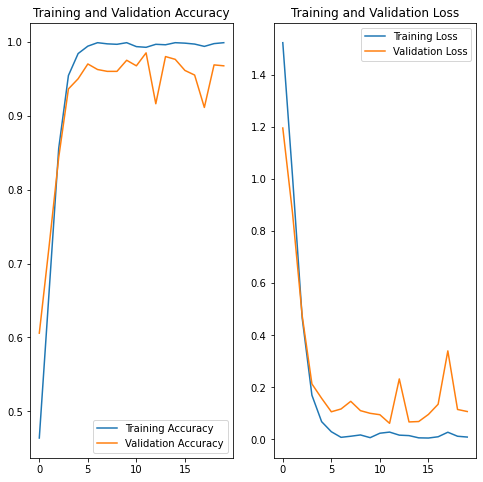

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pwd

/content/drive


In [ ]:
import os
os.chdir('/content')
!pwd


/content


In [ ]:
path=r'/content/drive/MyDrive/.kaggle/Data'


**VGG16 using ImageNet weights and training only top layers without Spec Aug**

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

model = VGG16(weights='imagenet')

# img_path = '/content/drive/MyDrive/.kaggle/Data/images_original/rock/rock00099.png'
# img = image.load_img(img_path, target_size=(224, 224))
# x = image.img_to_array(img)
# x = np.expand_dims(x, axis=0)
# x = preprocess_input(x)

# features = model.predict(x)

In [ ]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:

# load model without classifier layers
model = VGG16(weights='imagenet',include_top=False, input_shape=(288, 432, 3))
# mark loaded layers as not trainable
for layer in model.layers:
	layer.trainable = False

In [ ]:
from keras.models import Model
from keras.layers import Dense
from keras.layers import Flatten

In [ ]:
flat1 = Flatten()(model.layers[-2].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10)(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()
# ...

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 288, 432, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 288, 432, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 288, 432, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 144, 216, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 144, 216, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 144, 216, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 72, 108, 128)      0   

In [ ]:
import pathlib
data_dir = pathlib.Path(path+"/images_original")
image_count = len(list(data_dir.glob('*/*.png')))
print(image_count)

999


In [ ]:
blues = list(data_dir.glob('blues/*'))
PIL.Image.open(str(blues[0])).size

(432, 288)

In [ ]:
batch_size = 5
img_height = 288
img_width = 432

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 800 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 199 files for validation.


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs)

Epoch 1/10
160/160 [==============================] - 65s 381ms/step - loss: 144.6966 - accuracy: 0.4625 - val_loss: 15.3185 - val_accuracy: 0.3920
Epoch 2/10
160/160 [==============================] - 60s 376ms/step - loss: 2.3244 - accuracy: 0.6950 - val_loss: 4.2451 - val_accuracy: 0.4171
Epoch 3/10
160/160 [==============================] - 60s 376ms/step - loss: 1.0564 - accuracy: 0.7550 - val_loss: 2.7268 - val_accuracy: 0.5075
Epoch 4/10
160/160 [==============================] - 60s 376ms/step - loss: 0.8015 - accuracy: 0.7987 - val_loss: 4.0642 - val_accuracy: 0.4271
Epoch 5/10
160/160 [==============================] - 60s 376ms/step - loss: 0.5901 - accuracy: 0.8275 - val_loss: 2.8648 - val_accuracy: 0.5025
Epoch 6/10
160/160 [==============================] - 60s 376ms/step - loss: 0.8803 - accuracy: 0.7925 - val_loss: 6.5862 - val_accuracy: 0.4372
Epoch 7/10
160/160 [==============================] - 60s 377ms/step - loss: 1.6055 - accuracy: 0.7387 - val_loss: 2.5428 - val

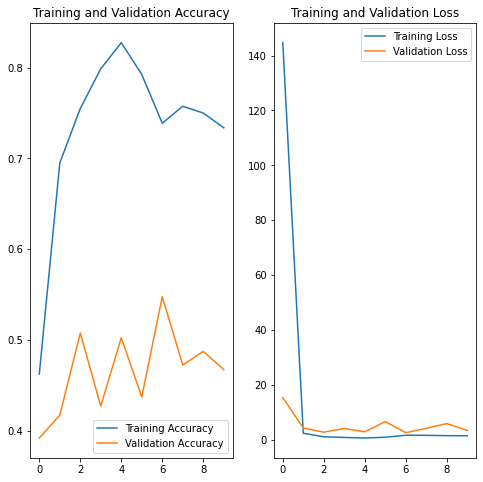

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**InceptionV3 using Imagenet weights , training all layers without spec augmetation data**

In [ ]:
from keras.applications.inception_v3 import InceptionV3
# load model
model = InceptionV3(weights='imagenet')
# summarize the model
model.summary()

96124928/96112376 [==============================] - 2s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)           

In [ ]:
flat1 = Flatten()(model.layers[-2].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10)(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                           

In [ ]:
batch_size = 5
img_height = 299
img_width = 299

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 800 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 199 files for validation.


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs)

Epoch 1/10
160/160 [==============================] - 59s 293ms/step - loss: 2.1942 - accuracy: 0.1775 - val_loss: 177.5627 - val_accuracy: 0.1055
Epoch 2/10
160/160 [==============================] - 44s 273ms/step - loss: 1.9876 - accuracy: 0.2362 - val_loss: 2.5086 - val_accuracy: 0.2714
Epoch 3/10
160/160 [==============================] - 44s 274ms/step - loss: 1.9045 - accuracy: 0.2663 - val_loss: 2.8608 - val_accuracy: 0.2864
Epoch 4/10
160/160 [==============================] - 46s 285ms/step - loss: 1.8811 - accuracy: 0.3212 - val_loss: 9.0633 - val_accuracy: 0.2161
Epoch 5/10
160/160 [==============================] - 44s 274ms/step - loss: 1.8204 - accuracy: 0.3200 - val_loss: 2.5744 - val_accuracy: 0.2764
Epoch 6/10
160/160 [==============================] - 44s 273ms/step - loss: 1.7509 - accuracy: 0.3425 - val_loss: 11.4623 - val_accuracy: 0.1960
Epoch 7/10
160/160 [==============================] - 44s 274ms/step - loss: 1.8322 - accuracy: 0.3125 - val_loss: 45.2734 - va

**InceptionV3 using Imagenet weights , training only top layers without spec augmetation data**


In [ ]:
model = InceptionV3(weights='imagenet',include_top=False, input_shape=(288, 432, 3))
# mark loaded layers as not trainable
for layer in model.layers:
	layer.trainable = False

87924736/87910968 [==============================] - 1s 0us/step


In [ ]:
flat1 = Flatten()(model.layers[-2].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10)(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 288, 432, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 143, 215, 32  864         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 143, 215, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                           

In [ ]:
batch_size = 5
img_height = 288
img_width = 432

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 800 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 999 files belonging to 10 classes.
Using 199 files for validation.


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs)

Epoch 1/10
160/160 [==============================] - 85s 134ms/step - loss: 323.3680 - accuracy: 0.2587 - val_loss: 50.8721 - val_accuracy: 0.2764
Epoch 2/10
160/160 [==============================] - 19s 118ms/step - loss: 22.6260 - accuracy: 0.3250 - val_loss: 2.4620 - val_accuracy: 0.2261
Epoch 3/10
160/160 [==============================] - 19s 118ms/step - loss: 2.6959 - accuracy: 0.1813 - val_loss: 2.2680 - val_accuracy: 0.1457
Epoch 4/10
160/160 [==============================] - 19s 117ms/step - loss: 2.1959 - accuracy: 0.1675 - val_loss: 2.3824 - val_accuracy: 0.1759
Epoch 5/10
160/160 [==============================] - 19s 118ms/step - loss: 2.1320 - accuracy: 0.1912 - val_loss: 2.2824 - val_accuracy: 0.1156
Epoch 6/10
160/160 [==============================] - 19s 118ms/step - loss: 2.2250 - accuracy: 0.1425 - val_loss: 2.3731 - val_accuracy: 0.0905
Epoch 7/10
160/160 [==============================] - 19s 117ms/step - loss: 2.2297 - accuracy: 0.1475 - val_loss: 2.3150 - va

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pwd

/content


In [ ]:
import os
os.chdir('/content')
!pwd


/content


In [ ]:
path=r'/content/drive/MyDrive/.kaggle/Data'


**VGG16 with imagenet weights and training only top layer with Spec Augmented data**

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

model = VGG16(weights='imagenet')

# img_path = '/content/drive/MyDrive/.kaggle/Data/images_original/rock/rock00099.png'
# img = image.load_img(img_path, target_size=(224, 224))
# x = image.img_to_array(img)
# x = np.expand_dims(x, axis=0)
# x = preprocess_input(x)

# features = model.predict(x)

In [ ]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:

# load model without classifier layers
model = VGG16(weights='imagenet',include_top=False, input_shape=(235, 464, 3))
# mark loaded layers as not trainable
for layer in model.layers:
	layer.trainable = False

In [ ]:
from keras.models import Model
from keras.layers import Dense
from keras.layers import Flatten

In [ ]:
flat1 = Flatten()(model.layers[-2].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10)(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()
# ...

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 235, 464, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 235, 464, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 235, 464, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 117, 232, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 117, 232, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 117, 232, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 58, 116, 128)      0     

In [ ]:
import pathlib
data_dir = pathlib.Path(path+"/Aug_images")
image_count = len(list(data_dir.glob('*/*.png')))
print(image_count)

3996


In [ ]:
blues = list(data_dir.glob('blues/*'))
PIL.Image.open(str(blues[0])).size

(464, 235)

In [ ]:
batch_size = 5
img_height = 235
img_width = 464

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3996 files belonging to 10 classes.
Using 3197 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3996 files belonging to 10 classes.
Using 799 files for validation.


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs)

Epoch 1/10
640/640 [==============================] - 319s 384ms/step - loss: 33.7056 - accuracy: 0.4964 - val_loss: 1.5163 - val_accuracy: 0.5544
Epoch 2/10
640/640 [==============================] - 204s 319ms/step - loss: 1.3333 - accuracy: 0.6287 - val_loss: 1.3678 - val_accuracy: 0.5832
Epoch 3/10
640/640 [==============================] - 204s 319ms/step - loss: 1.1190 - accuracy: 0.6606 - val_loss: 3.4451 - val_accuracy: 0.4706
Epoch 4/10
640/640 [==============================] - 204s 319ms/step - loss: 1.2369 - accuracy: 0.6450 - val_loss: 2.1480 - val_accuracy: 0.5432
Epoch 5/10
640/640 [==============================] - 204s 319ms/step - loss: 1.1707 - accuracy: 0.6609 - val_loss: 1.5002 - val_accuracy: 0.5820
Epoch 6/10
640/640 [==============================] - 204s 318ms/step - loss: 1.1512 - accuracy: 0.6628 - val_loss: 1.4703 - val_accuracy: 0.5757
Epoch 7/10
640/640 [==============================] - 204s 319ms/step - loss: 1.0370 - accuracy: 0.6850 - val_loss: 1.4401 

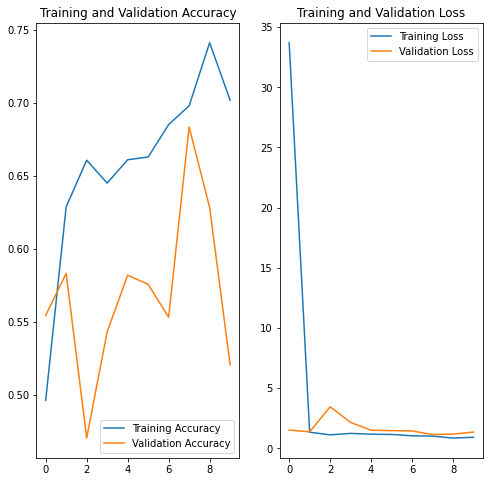

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**InceptionV3 with Imagenet weights and training all the layers**

In [ ]:
from keras.applications.inception_v3 import InceptionV3
# load model
model = InceptionV3(weights='imagenet',input_shape=(235, 464, 3))
# summarize the model
model.summary()

96124928/96112376 [==============================] - 1s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)           

In [ ]:
flat1 = Flatten()(model.layers[-2].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10)(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                           

In [ ]:
batch_size = 5
img_height = 235
img_width = 464

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3996 files belonging to 10 classes.
Using 3197 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3996 files belonging to 10 classes.
Using 799 files for validation.


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs)

Epoch 1/10
640/640 [==============================] - 190s 276ms/step - loss: 2.3138 - accuracy: 0.1261 - val_loss: 22.2584 - val_accuracy: 0.1514
Epoch 2/10
640/640 [==============================] - 171s 267ms/step - loss: 2.2425 - accuracy: 0.1526 - val_loss: 61.5809 - val_accuracy: 0.1502
Epoch 3/10
640/640 [==============================] - 171s 267ms/step - loss: 2.0515 - accuracy: 0.2305 - val_loss: 11.3393 - val_accuracy: 0.0876
Epoch 4/10
640/640 [==============================] - 171s 266ms/step - loss: 1.9180 - accuracy: 0.2756 - val_loss: 2.2441 - val_accuracy: 0.2966
Epoch 5/10
640/640 [==============================] - 171s 267ms/step - loss: 1.8563 - accuracy: 0.2818 - val_loss: 3.9891 - val_accuracy: 0.2979
Epoch 6/10
640/640 [==============================] - 171s 267ms/step - loss: 1.8439 - accuracy: 0.3034 - val_loss: 2.2764 - val_accuracy: 0.2691
Epoch 7/10
640/640 [==============================] - 171s 266ms/step - loss: 1.7906 - accuracy: 0.3056 - val_loss: 8.782

**InceptionV3 with Imagenet weights and training only top layers with Spec Augmented data**


In [ ]:
model = InceptionV3(weights='imagenet',include_top=False, input_shape=(235, 464, 3))
# mark loaded layers as not trainable
for layer in model.layers:
	layer.trainable = False

In [ ]:
flat1 = Flatten()(model.layers[-2].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10)(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()

In [ ]:
batch_size = 5
img_height = 288
img_width = 432

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs)

Epoch 1/10
640/640 [==============================] - 85s 123ms/step - loss: 34.6126 - accuracy: 0.2299 - val_loss: 2.1248 - val_accuracy: 0.1890
Epoch 2/10
640/640 [==============================] - 75s 116ms/step - loss: 2.1721 - accuracy: 0.2058 - val_loss: 2.0572 - val_accuracy: 0.1902
Epoch 3/10
640/640 [==============================] - 75s 116ms/step - loss: 2.0735 - accuracy: 0.2105 - val_loss: 1.9960 - val_accuracy: 0.2078
Epoch 4/10
640/640 [==============================] - 74s 116ms/step - loss: 2.0483 - accuracy: 0.2133 - val_loss: 2.2194 - val_accuracy: 0.1039
Epoch 5/10
640/640 [==============================] - 74s 115ms/step - loss: 2.0275 - accuracy: 0.2102 - val_loss: 2.0661 - val_accuracy: 0.1840
Epoch 6/10
640/640 [==============================] - 74s 115ms/step - loss: 2.0357 - accuracy: 0.2083 - val_loss: 2.0770 - val_accuracy: 0.1840
Epoch 7/10
640/640 [==============================] - 74s 115ms/step - loss: 2.0302 - accuracy: 0.2118 - val_loss: 2.0792 - val_a

**Mel Spectogram Generation and its Augmentation code**

In [ ]:
#Important link to refer
#  https://towardsdatascience.com/audio-deep-learning-made-simple-part-2-why-mel-spectrograms-perform-better-aad889a93505
# https://towardsdatascience.com/audio-deep-learning-made-simple-part-3-data-preparation-and-augmentation-24c6e1f6b52
# https://github.com/makcedward/nlpaug/blob/master/example/spectrogram_augmenter.ipynb

In [ ]:
import librosa
import numpy as np
import sklearn
path=r'/content/drive/MyDrive/.kaggle/Data/genres_original/rock'
# Load the audio file
AUDIO_FILE = path+"/rock.00099.wav"
samples, sample_rate = librosa.load(AUDIO_FILE, sr=None)

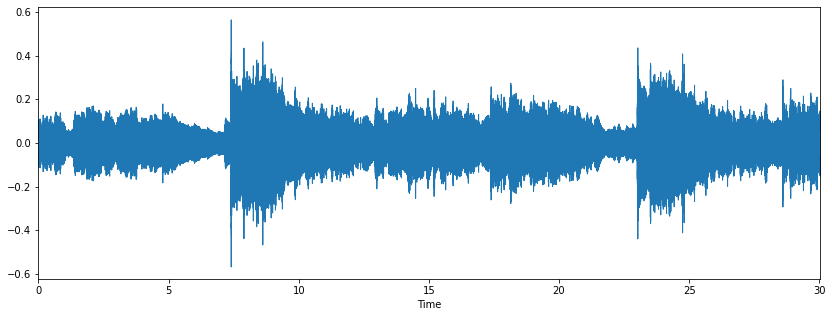

In [ ]:
import librosa.display
import matplotlib.pyplot as plt

# x-axis has been converted to time using our sample rate. 
# matplotlib plt.plot(y), would output the same figure, but with sample 
# number on the x-axis instead of seconds
plt.figure(figsize=(14, 5))
librosa.display.waveplot(samples, sr=sample_rate)
plt.show()

In [ ]:
from IPython.display import Audio
Audio(AUDIO_FILE)

In [ ]:
print ('Example shape ', samples.shape, 'Sample rate ', sample_rate, 'Data type', type(samples))

Example shape  (661794,) Sample rate  22050 Data type <class 'numpy.ndarray'>


/usr/local/lib/python3.7/dist-packages/librosa/display.py:955: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  "Trying to display complex-valued input. " "Showing magnitude instead."


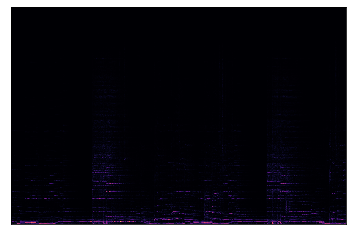

In [ ]:
sgram = librosa.stft(samples)
librosa.display.specshow(sgram)


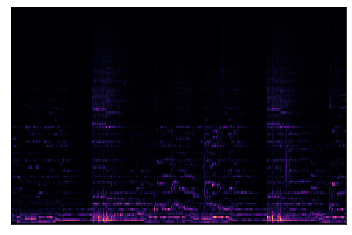

In [ ]:
# use the mel-scale instead of raw frequency
sgram_mag, _ = librosa.magphase(sgram)
mel_scale_sgram = librosa.feature.melspectrogram(S=sgram_mag, sr=sample_rate)
librosa.display.specshow(mel_scale_sgram)

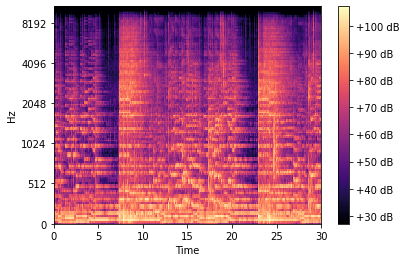

In [ ]:
# use the decibel scale to get the final Mel Spectrogram
mel_sgram = librosa.amplitude_to_db(mel_scale_sgram, ref=np.min)
librosa.display.specshow(mel_sgram, sr=sample_rate, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

MFCC is of type <class 'numpy.ndarray'> with shape (20, 1293)


/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_data.py:236: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  "Numerical issues were encountered "
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_data.py:255: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  "Numerical issues were encountered "


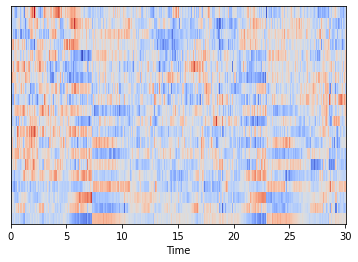

In [ ]:
mfcc = librosa.feature.mfcc(samples, sr=sample_rate)

# Center MFCC coefficient dimensions to the mean and unit variance
mfcc = sklearn.preprocessing.scale(mfcc, axis=1)
librosa.display.specshow(mfcc, sr=sample_rate, x_axis='time')

print (f'MFCC is of type {type(mfcc)} with shape {mfcc.shape}')

In [ ]:
!pip install numpy requests nlpaug


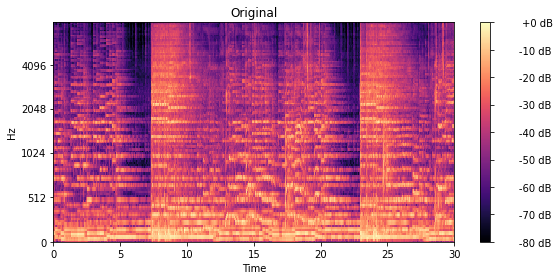

In [ ]:
from nlpaug.util.audio.loader import AudioLoader
from nlpaug.util.audio.visualizer import AudioVisualizer
data = AudioLoader.load_mel_spectrogram(AUDIO_FILE, n_mels=128)
AudioVisualizer.spectrogram('Original', data)

In [ ]:
import nlpaug.augmenter.spectrogram as nas
import nlpaug.flow as naf

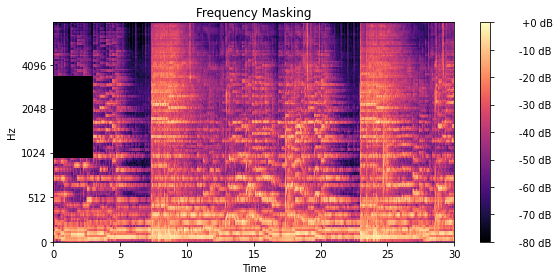

In [ ]:
aug = nas.FrequencyMaskingAug(zone=(0, 1))
aug_data = aug.substitute(data)
AudioVisualizer.spectrogram('Frequency Masking', aug_data)

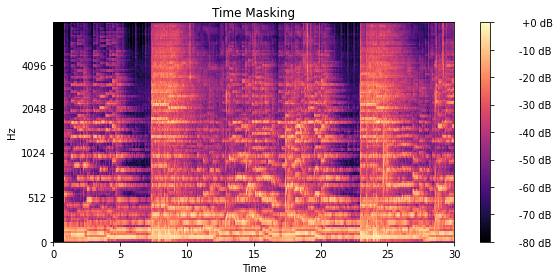

In [ ]:
aug = nas.TimeMaskingAug(zone=(0, 1))

aug_data = aug.substitute(data)
AudioVisualizer.spectrogram('Time Masking', aug_data)

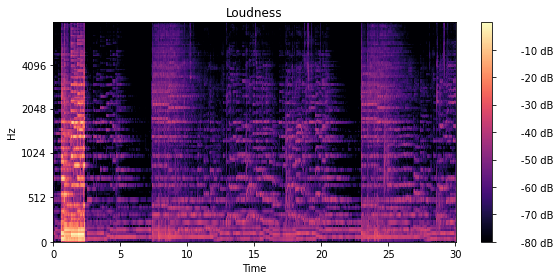

In [ ]:
aug = nas.LoudnessAug()

aug_data = aug.substitute(data)
AudioVisualizer.spectrogram('Loudness', aug_data)

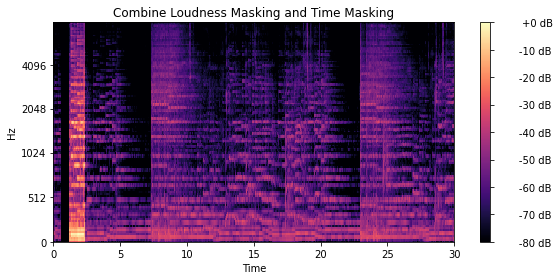

In [ ]:
import nlpaug.flow as naf

flow = naf.Sequential([ 
    nas.TimeMaskingAug(), 
    nas.LoudnessAug()
])
aug_data = flow.augment(data)
AudioVisualizer.spectrogram('Combine Loudness Masking and Time Masking', aug_data)

In [ ]:
def spectrogram(fpath, spectrogram):
    plt.figure(figsize=(8, 4))
    librosa.display.specshow(
        librosa.power_to_db(spectrogram, ref=np.max))
    # plt.colorbar(format='%+10.0f dB')
    # plt.title(title)
    # plt.tight_layout()
    plt.savefig(fpath,bbox_inches='tight')
    # plt.show()

In [ ]:
# data = AudioLoader.load_mel_spectrogram(AUDIO_FILE, n_mels=128)
# spectrogram("/content/drive/MyDrive/.kaggle/Data/Aug_images/example.png",data)


**Finally creating Mel Spectrogram from audio file and Augmenting it**

In [ ]:
p="/content/drive/MyDrive/.kaggle/Data/genres_original"

In [ ]:
import os
os.chdir("/content")

1  jazz.00004.wav augmented
2  jazz.00001.wav augmented
3  jazz.00003.wav augmented
4  jazz.00000.wav augmented
5  jazz.00002.wav augmented


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


6  jazz.00007.wav augmented
7  jazz.00006.wav augmented
8  jazz.00014.wav augmented
9  jazz.00008.wav augmented
10  jazz.00010.wav augmented
11  jazz.00011.wav augmented
12  jazz.00013.wav augmented
13  jazz.00009.wav augmented
14  jazz.00005.wav augmented
15  jazz.00012.wav augmented
16  jazz.00022.wav augmented
17  jazz.00024.wav augmented
18  jazz.00015.wav augmented
19  jazz.00018.wav augmented
20  jazz.00016.wav augmented
21  jazz.00025.wav augmented
22  jazz.00020.wav augmented
23  jazz.00021.wav augmented
24  jazz.00026.wav augmented
25  jazz.00017.wav augmented
26  jazz.00023.wav augmented
27  jazz.00019.wav augmented
28  jazz.00029.wav augmented
29  jazz.00040.wav augmented
30  jazz.00041.wav augmented
31  jazz.00038.wav augmented
32  jazz.00032.wav augmented
33  jazz.00034.wav augmented
34  jazz.00030.wav augmented
35  jazz.00042.wav augmented
36  jazz.00039.wav augmented
37  jazz.00028.wav augmented
38  jazz.00031.wav augmented
39  jazz.00027.wav augmented
40  jazz.00036.wav

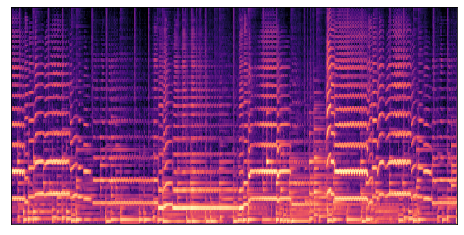

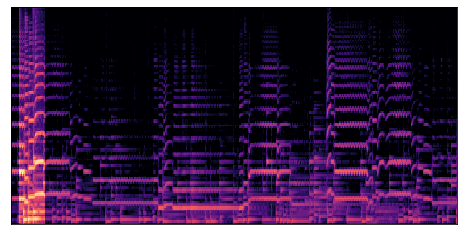

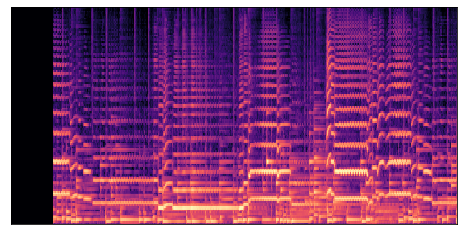

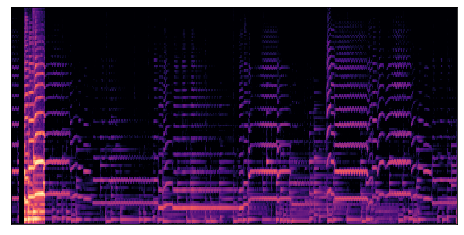

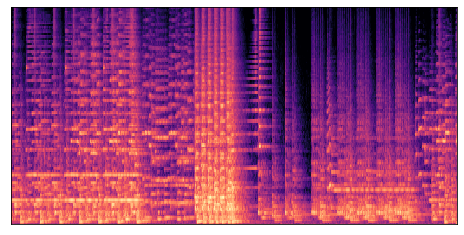

...

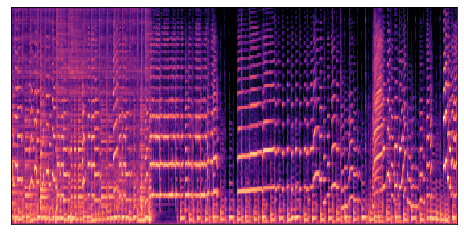

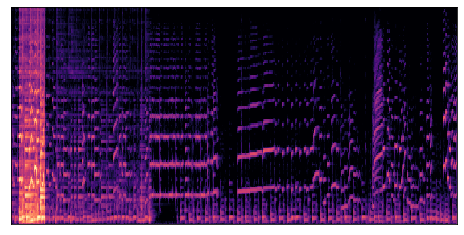

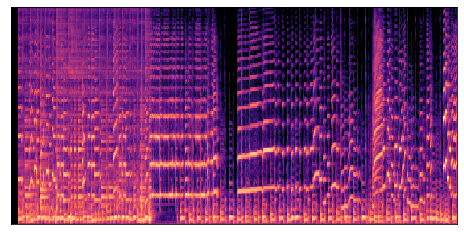

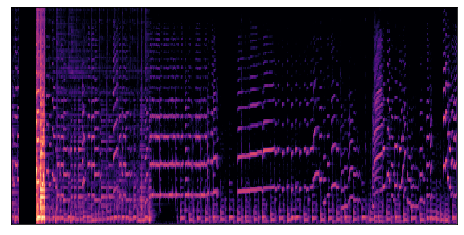

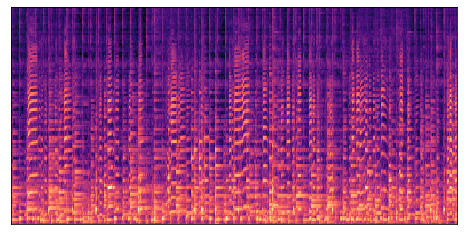

Error in callback <function flush_figures at 0x7f7bae146200> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:

# os.chdir("/content/drive/MyDrive/.kaggle/Data/Aug_images")
count=0
for dirname, _, filenames in os.walk(p):
  fold_name=os.path.basename(dirname)
  if fold_name in ["genres_original","rock",'country','metal','blues','pop','hiphop','classical','disco','reggae']:
    pass
  else:
    try:
      os.mkdir("/content/drive/MyDrive/.kaggle/Data/Aug_images/{}".format(fold_name))
      for filename in filenames:
        audio_file_path=os.path.join(dirname, filename)
        data = AudioLoader.load_mel_spectrogram(audio_file_path, n_mels=128)
        img_path="/content/drive/MyDrive/.kaggle/Data/Aug_images/{}/{}".format(fold_name,filename)
        spectrogram(img_path+"O.png", data)
        aug = nas.LoudnessAug()
        aug_data = aug.substitute(data)
        spectrogram(img_path+"L.png", aug_data)
        aug = nas.TimeMaskingAug(zone=(0, 1))
        aug_data = aug.substitute(data)
        spectrogram(img_path+"T.png", aug_data)
        aug_data = flow.augment(data)
        spectrogram(img_path+"LT.png", aug_data)
        count+=1
        print(count," {} augmented".format(filename))
    except:
      pass
    


In [ ]:
p="/content/drive/MyDrive/.kaggle/Data/genres_original/jazz"
# jazz.00054.wav was kind of corrupted so removed and then run the code others get augmented perfectly
#This I concluded from the below list and above list where it showed error

In [ ]:

count=0
for dirname, _, filenames in os.walk(p):
  fold_name=os.path.basename(dirname)
  for filename in filenames:
    print(filename)


jazz.00004.wav
jazz.00001.wav
jazz.00003.wav
jazz.00000.wav
jazz.00002.wav
jazz.00007.wav
jazz.00006.wav
jazz.00014.wav
jazz.00008.wav
jazz.00010.wav
jazz.00011.wav
jazz.00013.wav
jazz.00009.wav
jazz.00005.wav
jazz.00012.wav
jazz.00022.wav
jazz.00024.wav
jazz.00015.wav
jazz.00018.wav
jazz.00016.wav
jazz.00025.wav
jazz.00020.wav
jazz.00021.wav
jazz.00026.wav
jazz.00017.wav
jazz.00023.wav
jazz.00019.wav
jazz.00029.wav
jazz.00040.wav
jazz.00041.wav
jazz.00038.wav
jazz.00032.wav
jazz.00034.wav
jazz.00030.wav
jazz.00042.wav
jazz.00039.wav
jazz.00028.wav
jazz.00031.wav
jazz.00027.wav
jazz.00036.wav
jazz.00037.wav
jazz.00035.wav
jazz.00033.wav
jazz.00049.wav
jazz.00050.wav
jazz.00045.wav
jazz.00044.wav
jazz.00046.wav
jazz.00052.wav
jazz.00054.wav
jazz.00058.wav
jazz.00051.wav
jazz.00057.wav
jazz.00048.wav
jazz.00055.wav
jazz.00053.wav
jazz.00056.wav
jazz.00047.wav
jazz.00043.wav
jazz.00069.wav
jazz.00059.wav
jazz.00065.wav
jazz.00061.wav
jazz.00064.wav
jazz.00060.wav
jazz.00062.wav
jazz.00066